In [11]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
import numpy as np
import time
import os
import subprocess
import functions as fn

In [12]:
from importlib import reload
reload(fn)

<module 'functions' from '/global/u2/s/suhas31/thesisDraft2/functions.py'>

In [13]:
file_name = "/pscratch/sd/s/suhas31/Data/BGS_data.parquet"
DESI = pd.read_parquet(file_name)
DESI.columns

Index(['TargetID', 'RA', 'Dec', 'Z', 'M_u', 'M_g', 'M_r', 'M_i', 'M_z',
       'kcorr_u', 'kcorr_g', 'kcorr_r', 'kcorr_i', 'kcorr_z', 'ivar_M_u',
       'ivar_M_g', 'ivar_M_r', 'ivar_M_i', 'ivar_M_z', 'LogMstar', 'm_u',
       'm_g', 'm_r', 'm_i', 'm_z', 'ur', 'gr', 'N_N_1Mpc', 'LogMstar_N_1Mpc',
       'N_N_2Mpc', 'LogMstar_N_2Mpc', 'N_N_3Mpc', 'LogMstar_N_3Mpc'],
      dtype='object')

In [14]:
for i in DESI.columns:
    globals()[i] = np.array(DESI[i])

___
# Dvider Evolution with Redshift:
Figures about how the green valley divider evolves with redshift.

### 1. CMD Panels

CMD cache found. Loading...


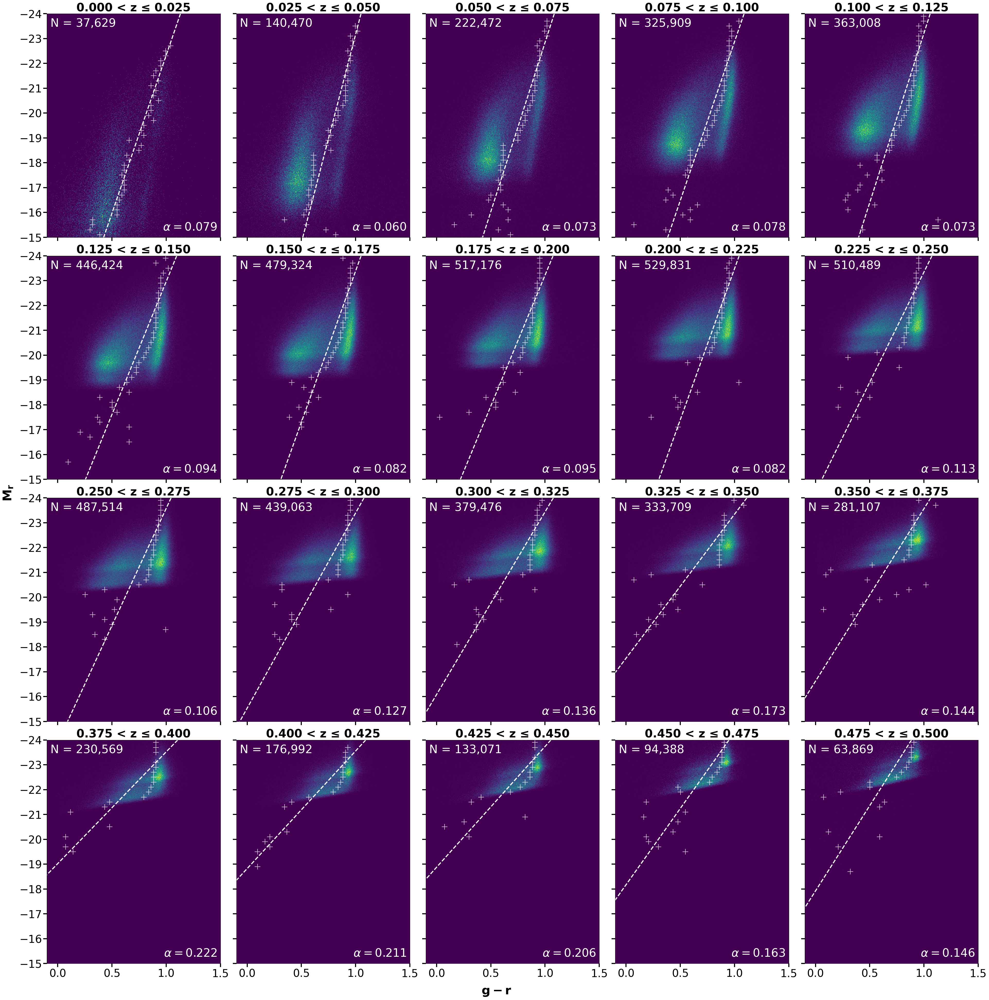

In [16]:
# Paths
cache_file = "/pscratch/sd/s/suhas31/numpyFiles/cmdZ_cache.npz"
compute_script = "/global/u2/s/suhas31/thesisDraft2/cmdZ_calc.py"

if not os.path.exists(cache_file):

    print("CMD cache not found. Running compute script...")
    subprocess.run(["python", compute_script], check=True)

else:

    print("CMD cache found. Loading...")


# Load cache
cache = np.load(cache_file, allow_pickle=True)

h2d_list = cache["h2d_list"]
divider_points = cache["divider_points"]
divider_mr = cache["divider_mr"]
alpha_vals = cache["alpha_vals"]
counts = cache["counts"]

zBins = cache["zBins"]
grBins = cache["grBins"]
mrBins = cache["mrBins"]

grMin = grBins.min()
grMax = grBins.max()

mrMin = mrBins.min()
mrMax = mrBins.max()

# Plot CMD panels
fig, axs = plt.subplots(
    4, 5,
    figsize=(40, 40),
    sharex=True,
    sharey=True
)

axs = axs.flatten()

for ax in axs:
    ax.tick_params(
        axis="both",
        which="major",
        labelsize=30,   # tick label font size
        width=3,        # tick thickness
        length=10       # tick length
    )

for iz in range(len(h2d_list)):

    ax = axs[iz]

    z_lo = zBins[iz]
    z_hi = zBins[iz+1]

    h2d = h2d_list[iz].T

    hNorm = h2d / h2d.max()

    ax.imshow(
        hNorm,
        origin="lower",
        extent=[grMin, grMax, mrMin, mrMax],
        cmap="viridis",
        aspect="auto",
        interpolation="nearest"
    )

    dividers = divider_points[iz]
    mrVals = divider_mr[iz]

    ax.scatter(
        dividers,
        mrVals,
        marker="+",
        c="white",
        s=250,
        alpha=.75,
        # linewidths=1.5
    )

    if len(dividers) >= 2:

        coefs = np.polyfit(mrVals, dividers, deg=1)
        p = np.poly1d(coefs)

        Mr_line = np.linspace(mrMin, mrMax, 200)

        ax.plot(
            p(Mr_line),
            Mr_line,
            "--",
            c="white",
            linewidth=3
        )

        alpha_val = abs(coefs[0])

    else:

        alpha_val = np.nan


    ax.set_title(
        f"{z_lo:.3f} < z ≤ {z_hi:.3f}",
        fontsize=32,
        weight="bold"
    )

    ax.text(
        0.02,0.98,
        f"N = {counts[iz]:,}",
        transform=ax.transAxes,
        ha="left",
        va="top",
        fontsize=32,
        color="white"
    )

    ax.text(
        0.98,0.02,
        rf"$\alpha = {alpha_val:.3f}$",
        transform=ax.transAxes,
        ha="right",
        va="bottom",
        fontsize=32,
        color="white"
    )

    ax.set_xlim([-0.1,1.5])
    ax.set_ylim([-15,-24])


fig.supylabel(r"$\mathbf{M_r}$", fontsize=34)
fig.supxlabel(r"$\mathbf{g-r}$", fontsize=34)

plt.tight_layout(rect=[.0175, 0.009, .98, .98])

plt.savefig("/pscratch/sd/s/suhas31/ThesisFigures/cmdZ.pdf")
plt.show()

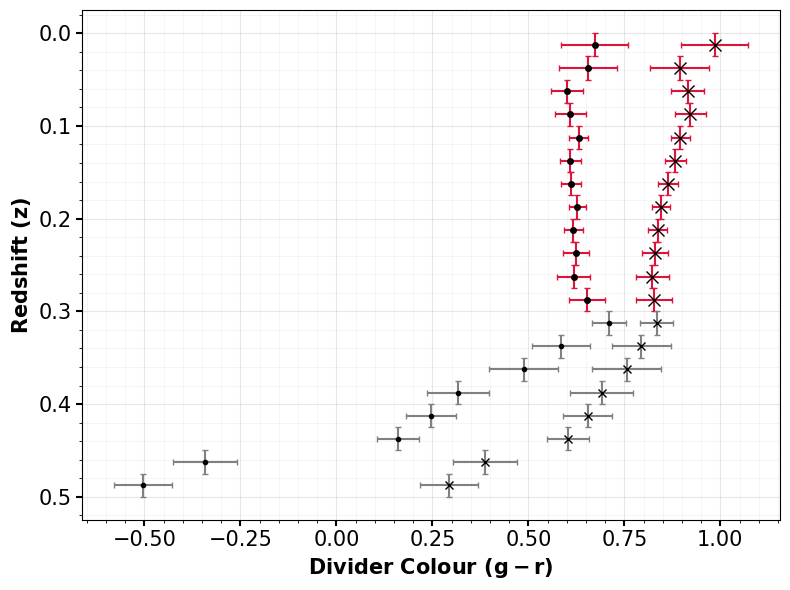

In [8]:
Mr_eval1 = -21.0
Mr_eval2 = -18.0

# -----------------------------
# Bins
# -----------------------------
z_min, z_max, z_step = 0.0, 0.5, 0.025
zBins = np.arange(z_min, z_max + z_step, z_step)

MrMin, MrMax, MrStep = -14.0, -24.0, -0.2
MrEdges = np.arange(MrMin, MrMax + MrStep, MrStep)

grMin, grMax = -0.5, 1.75
grEdges = np.linspace(grMin, grMax, 201)

zCenters = 0.5 * (zBins[:-1] + zBins[1:])
z_err = np.full_like(zCenters, z_step / 2)

gr_M21 = np.full(len(zCenters), np.nan)
gr_err_M21 = np.full(len(zCenters), np.nan)

gr_M18 = np.full(len(zCenters), np.nan)
gr_err_M18 = np.full(len(zCenters), np.nan)

# -----------------------------
# Compute dividers
# -----------------------------
for iz in range(len(zBins) - 1):

    z_lo = zBins[iz]
    z_hi = zBins[iz+1]

    maskZ = (Z > z_lo) & (Z <= z_hi)

    FigZ_Mr = M_r[maskZ]
    FigZ_gr = gr[maskZ]

    dividers = []
    mrVals = []
    weights = []

    for i in range(len(MrEdges) - 1):

        Mr_hi = MrEdges[i]
        Mr_lo = MrEdges[i+1]

        Mr_mask = (FigZ_Mr <= Mr_hi) & (FigZ_Mr > Mr_lo)
        Fig_data = FigZ_gr[Mr_mask]

        if len(Fig_data) < 20:
            continue

        try:

            bin_centers, counts, dg_fit, gauss1, gauss2, popt = \
                fn.fit_double_gauss(Fig_data, bins=grEdges)

            if np.sum(gauss1) > 0 and np.sum(gauss2) > 0:

                x_div, tau = fn.CR_div(bin_centers, gauss1, gauss2)

                if x_div is not None and np.isfinite(x_div):

                    dividers.append(x_div)
                    mrVals.append(0.5 * (Mr_hi + Mr_lo))
                    weights.append(len(Fig_data))

        except Exception:
            continue

    if len(dividers) >= 2:

        (a, b), cov = np.polyfit(
            mrVals, dividers,
            deg=1,
            w=weights,
            cov=True
        )
    
        # divider values
        gr_M21[iz] = a * Mr_eval1 + b
        gr_M18[iz] = a * Mr_eval2 + b
    
        # weighted RMS scatter about the fitted divider
        mrVals_arr = np.array(mrVals)
        dividers_arr = np.array(dividers)
        weights_arr = np.array(weights)
    
        fit_vals = a * mrVals_arr + b
        resid = dividers_arr - fit_vals
    
        sigma_fit = np.sqrt(
            np.sum(weights_arr * resid**2) / np.sum(weights_arr)
        )
    
        # same color uncertainty for both points
        gr_err_M21[iz] = sigma_fit
        gr_err_M18[iz] = sigma_fit

# Plot
plt.rcParams.update({
    'xtick.labelsize': 15,
    'ytick.labelsize': 15,
    'xtick.major.width': 1.5,
    'ytick.major.width': 1.5,
    'xtick.major.size': 4,
    'ytick.major.size': 4,
})

fig, ax = plt.subplots(figsize=(8, 6))

valid = (
    np.isfinite(gr_M21) &
    np.isfinite(gr_err_M21) &
    np.isfinite(gr_M18) &
    np.isfinite(gr_err_M18)
)

m_low = (zCenters <= 0.3) & valid
m_high = (zCenters > 0.3) & valid

# --- Mr = -21 ---
ax.errorbar(
    gr_M21[m_low],
    zCenters[m_low],
    yerr=z_err[m_low],
    xerr=gr_err_M21[m_low],
    fmt='x',
    ms=8,
    mfc='black',
    mec='black',
    color='crimson',
    capsize=2,
    linewidth=1.5
)

ax.errorbar(
    gr_M21[m_high],
    zCenters[m_high],
    yerr=z_err[m_high],
    xerr=gr_err_M21[m_high],
    fmt='x',
    ms=6,
    mfc='black',
    mec='black',
    color='gray',
    capsize=2,
    linewidth=1.5
)

# --- Mr = -18 ---
ax.errorbar(
    gr_M18[m_low],
    zCenters[m_low],
    yerr=z_err[m_low],
    xerr=gr_err_M18[m_low],
    fmt='.',
    ms=8,
    mfc='black',
    mec='black',
    color='crimson',
    capsize=2,
    linewidth=1.5
)

ax.errorbar(
    gr_M18[m_high],
    zCenters[m_high],
    yerr=z_err[m_high],
    xerr=gr_err_M18[m_high],
    fmt='.',
    ms=6,
    mfc='black',
    mec='black',
    color='gray',
    capsize=2,
    linewidth=1.5
)

# labels
ax.set_ylabel(r'Redshift ($\mathbf{z}$)', 
              weight='bold',
              fontsize=15)
ax.set_xlabel(r'Divider Colour ($\mathbf{g-r}$)',
              weight='bold',
              fontsize=15)

ax.set_ylim(z_min-.025, z_max+.025)
ax.yaxis.set_inverted(True)

# grid
ax.grid(True, which='major', alpha=0.3, linewidth=0.8)
ax.grid(True, which='minor', alpha=0.15, linewidth=0.6)

ax.minorticks_on()

plt.tight_layout()

plt.savefig("/pscratch/sd/s/suhas31/ThesisFigures/dividerEvolution_Z.pdf")
plt.show()

In [112]:
print(f'Mr18 = {gr_M18}')
print(f'Mr21 = {gr_M21}')

Mr18 = [ 0.67236043  0.65486525  0.60018051  0.60902872  0.63081257  0.609627
  0.61188332  0.62746201  0.61721108  0.62441655  0.61875084  0.65285539
  0.71016391  0.5855058   0.48744966  0.31745157  0.24661689  0.16077158
 -0.34150098 -0.50399714]
Mr21 = [0.98505318 0.89394018 0.91486334 0.92134482 0.8951038  0.88285799
 0.8631034  0.84555617 0.83699043 0.83027874 0.82280374 0.82636966
 0.83403709 0.7946368  0.75615719 0.69084943 0.65446992 0.60305495
 0.38630649 0.2942238 ]


___
# Divider Evolution with Local Stellar Mass Density

In [49]:
print(len(gr_M21))

20


CMD ENV cache found. Loading...


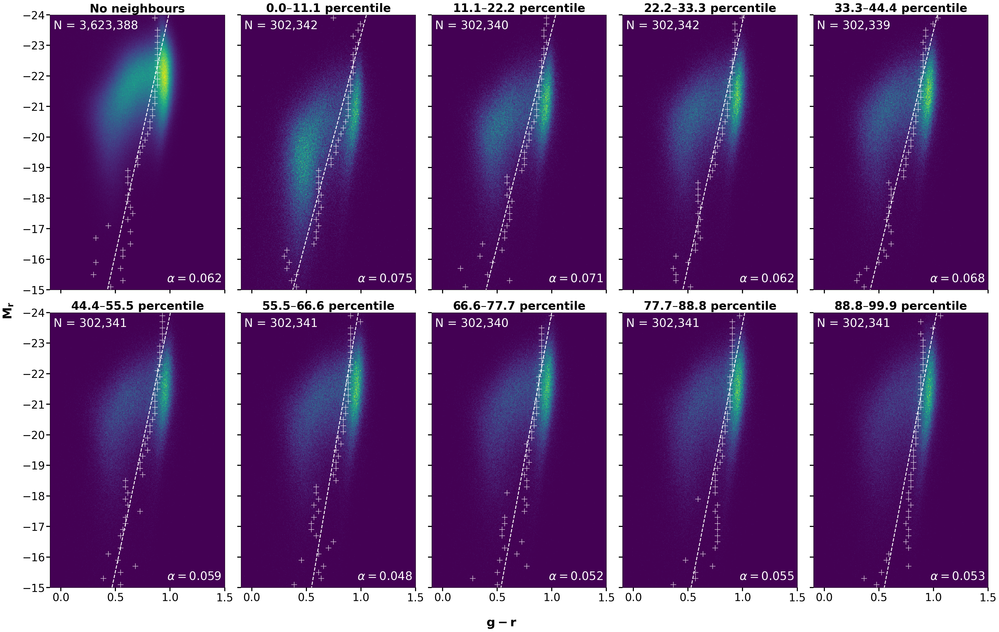

In [20]:
# Paths
cache_file = "/pscratch/sd/s/suhas31/numpyFiles/cmdEnv_cache.npz"
compute_script = "/global/u2/s/suhas31/thesisDraft2/cmdEnv_calc.py"

# -----------------------------
# Check cache
# -----------------------------
if not os.path.exists(cache_file):

    print("CMD ENV cache not found. Running compute script...")
    subprocess.run(["python", compute_script], check=True)

else:

    print("CMD ENV cache found. Loading...")

# -----------------------------
# Load cache
# -----------------------------
cache = np.load(cache_file, allow_pickle=True)

h2d_list = cache["h2d_list"]
divider_points = cache["divider_points"]
divider_mr = cache["divider_mr"]
alpha_vals = cache["alpha_vals"]
counts = cache["counts"]

grBins = cache["grBins"]
mrBins = cache["mrBins"]
p_edges = cache["p_edges"]

grMin, grMax = grBins.min(), grBins.max()
mrMin, mrMax = mrBins.min(), mrBins.max()

# -----------------------------
# Titles
# -----------------------------
env_titles = ["No neighbours"]

for i in range(len(p_edges) - 1):
    env_titles.append(
        rf"$\mathbf{{{i*11.1:.1f}}}$–$\mathbf{{{(i+1)*11.1:.1f}}}$ percentile"
    )

# -----------------------------
# Figure (5x2)
# -----------------------------
fig, axs = plt.subplots(
    2, 5,
    figsize=(40, 25),
    sharex=True,
    sharey=True
)

axs = axs.flatten()

for ax in axs:
    ax.tick_params(
        axis="both",
        which="major",
        labelsize=30,   # tick label font size
        width=3,        # tick thickness
        length=10       # tick length
    )

# -----------------------------
# Panels
# -----------------------------
for i in range(len(h2d_list)):

    ax = axs[i]

    h2d = h2d_list[i].T
    hNorm = h2d / h2d.max() if h2d.max() > 0 else h2d

    ax.imshow(
        hNorm,
        origin="lower",
        extent=[grMin, grMax, mrMin, mrMax],
        cmap="viridis",
        aspect="auto",
        interpolation="nearest"
    )

    dividers = divider_points[i]
    mrVals = divider_mr[i]

    ax.scatter(
        dividers,
        mrVals,
        marker="+",
        c="white",
        s=250,
        alpha=.75,
    )

    if len(dividers) >= 2:

        coefs = np.polyfit(mrVals, dividers, deg=1)
        p = np.poly1d(coefs)

        Mr_line = np.linspace(mrMin, mrMax, 200)

        ax.plot(
            p(Mr_line),
            Mr_line,
            "--",
            c="white",
            linewidth=2.5
        )

        alpha_val = abs(coefs[0])

    else:
        alpha_val = np.nan

    ax.set_title(
        env_titles[i],
        fontsize=32,
        weight="bold"
    )

    ax.text(
        0.02, 0.98,
        f"N = {counts[i]:,}",
        transform=ax.transAxes,
        ha="left",
        va="top",
        fontsize=32,
        color="white"
    )

    ax.text(
        0.98, 0.02,
        rf"$\alpha = {alpha_val:.3f}$",
        transform=ax.transAxes,
        ha="right",
        va="bottom",
        fontsize=32,
        color="white"
    )

    ax.set_xlim([-0.1, 1.5])
    ax.set_ylim([-15, -24])

# -----------------------------
# Labels
# -----------------------------
fig.supylabel(r"$\mathbf{M_r}$", fontsize=34)
fig.supxlabel(r"$\mathbf{g-r}$", fontsize=34)

plt.tight_layout(rect=[0.02, 0.02, 0.98, 0.98])

plt.savefig("/pscratch/sd/s/suhas31/ThesisFigures/cmdEnv.pdf")

plt.show()

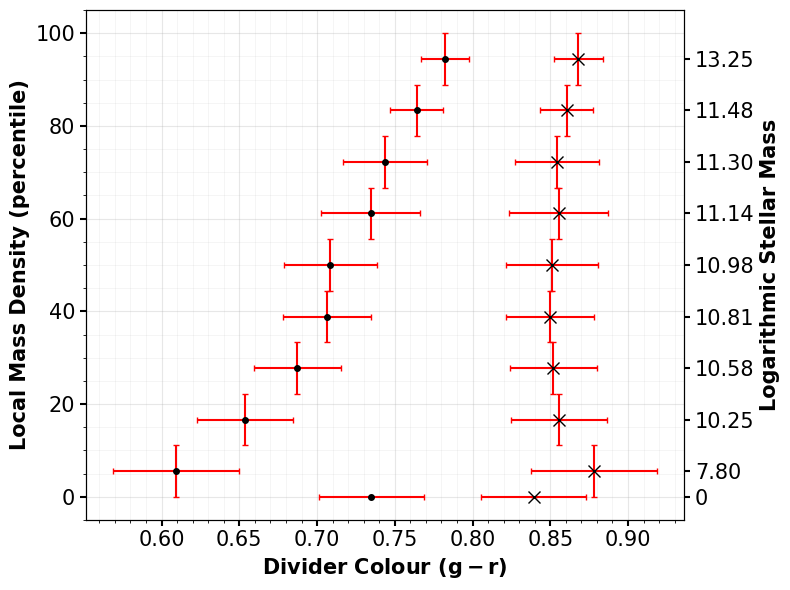

In [9]:
Mr_eval1 = -21.0
Mr_eval2 = -18.0

rho = LogMstar_N_2Mpc

# -----------------------------
# Environment bins
# -----------------------------
mask0 = rho != 0

percentiles = np.linspace(0, 100, 10)
p_edges = np.percentile(rho[mask0], percentiles)

nEnv = 10

# percentile centers (0, 5, 15, ..., 95)
envCenters = np.zeros(nEnv)
env_err = np.zeros(nEnv)

envCenters[0] = 0.0
env_err[0] = 0.0

for i in range(1, nEnv):
    lo = percentiles[i-1]
    hi = percentiles[i]

    envCenters[i] = 0.5 * (lo + hi)
    env_err[i] = 0.5 * (hi - lo)

# -----------------------------
# Arrays
# -----------------------------
gr_M21 = np.full(nEnv, np.nan)
gr_err_M21 = np.full(nEnv, np.nan)

gr_M18 = np.full(nEnv, np.nan)
gr_err_M18 = np.full(nEnv, np.nan)

# -----------------------------
# Compute dividers
# -----------------------------
for j in range(nEnv):

    if j == 0:
        maskEnv = (rho == 0)
    else:
        lo = p_edges[j-1]
        hi = p_edges[j]

        if j == 1:
            maskEnv = (rho > 0) & (rho <= hi)
        else:
            maskEnv = (rho > lo) & (rho <= hi)

    Fig_Mr = M_r[maskEnv]
    Fig_gr = gr[maskEnv]

    dividers = []
    mrVals = []
    weights = []

    for i in range(len(MrEdges) - 1):

        Mr_hi = MrEdges[i]
        Mr_lo = MrEdges[i+1]

        Mr_mask = (Fig_Mr <= Mr_hi) & (Fig_Mr > Mr_lo)
        Fig_data = Fig_gr[Mr_mask]

        if len(Fig_data) < 20:
            continue

        try:
            bin_centers, counts, dg_fit, gauss1, gauss2, popt = \
                fn.fit_double_gauss(Fig_data, bins=grEdges)

            if np.sum(gauss1) > 0 and np.sum(gauss2) > 0:

                x_div, tau = fn.CR_div(bin_centers, gauss1, gauss2)

                if x_div is not None and np.isfinite(x_div):
                    dividers.append(x_div)
                    mrVals.append(0.5 * (Mr_hi + Mr_lo))
                    weights.append(len(Fig_data))

        except Exception:
            continue

    if len(dividers) >= 2:

        (a, b), cov = np.polyfit(
            mrVals, dividers,
            deg=1,
            w=weights,
            cov=True
        )

        gr_M21[j] = a * Mr_eval1 + b
        gr_M18[j] = a * Mr_eval2 + b

        # weighted scatter
        mrVals_arr = np.array(mrVals)
        dividers_arr = np.array(dividers)
        weights_arr = np.array(weights)

        fit_vals = a * mrVals_arr + b
        resid = dividers_arr - fit_vals

        sigma_fit = np.sqrt(
            np.sum(weights_arr * resid**2) / np.sum(weights_arr)
        )

        gr_err_M21[j] = sigma_fit
        gr_err_M18[j] = sigma_fit

# -----------------------------
# Plot (flipped axes like you want)
# -----------------------------
plt.rcParams.update({
    'xtick.labelsize': 15,
    'ytick.labelsize': 15,
    'xtick.major.width': 1.5,
    'ytick.major.width': 1.5,
    'xtick.major.size': 4,
    'ytick.major.size': 4,
})

fig, ax = plt.subplots(figsize=(8, 6))

valid = (
    np.isfinite(gr_M21) &
    np.isfinite(gr_err_M21) &
    np.isfinite(gr_M18) &
    np.isfinite(gr_err_M18)
)

# --- Mr = -21 ---
ax.errorbar(
    gr_M21[valid],
    envCenters[valid],
    xerr=gr_err_M21[valid],
    yerr=env_err[valid],
    fmt='x',
    color='black',
    ecolor='red',
    ms=8,
    capsize=2,
    linewidth=1.5
)

# --- Mr = -18 ---
ax.errorbar(
    gr_M18[valid],
    envCenters[valid],
    xerr=gr_err_M18[valid],
    yerr=env_err[valid],
    fmt='.',
    color='black',
    ecolor='red',
    ms=8,
    capsize=2,
    linewidth=1.5
)

# ----------------------------------
# Secondary y-axis: log(M*) values
# ----------------------------------
ax2 = ax.twinx()

# Match limits
ax2.set_ylim(ax.get_ylim())

# Tick positions = same as percentile centers
ax2.set_yticks(envCenters)

# Tick labels = corresponding log(M*) values
labels = []

for j in range(len(envCenters)):
    if j == 0:
        labels.append("0")  # no neighbours
    else:
        lo = p_edges[j-1]
        hi = p_edges[j]
        labels.append(f"{0.5*(lo+hi):.2f}")  # midpoint value

ax2.set_yticklabels(labels)

ax2.set_ylabel('Logarithmic Stellar Mass', weight='bold', fontsize=15)

# labels
ax.set_xlabel(r'Divider Colour ($\mathbf{g-r}$)', weight='bold', fontsize=15)
ax.set_ylabel("Local Mass Density (percentile)", weight='bold', fontsize=15)

# grid
ax.grid(True, which='major', alpha=0.3, linewidth=0.8)
ax.grid(True, which='minor', alpha=0.15, linewidth=0.6)
ax.minorticks_on()

plt.tight_layout()

plt.savefig("/pscratch/sd/s/suhas31/ThesisFigures/dividerEvolution_env.pdf")
plt.show()

In [10]:
print(p_edges)

[ 5.54766521 10.05156574 10.45768099 10.71004257 10.90161944 11.06718044
 11.22243165 11.38397278 11.58040602 14.92227516]


In [115]:
print(f'Mr18 = {gr_M18}')
print(f'Mr21 = {gr_M21}')
print(f'Logarithmic Stellar Mass = {labels}')

Mr18 = [0.73500489 0.60928317 0.65364277 0.6874111  0.70653862 0.70862045
 0.73438312 0.74399118 0.76398043 0.78210628]
Mr21 = [0.83931125 0.87818775 0.85556301 0.85202698 0.8500899  0.85088337
 0.85550003 0.85446776 0.86047521 0.86811939]
Logarithmic Stellar Mass = ['0', '7.80', '10.25', '10.58', '10.81', '10.98', '11.14', '11.30', '11.48', '13.25']


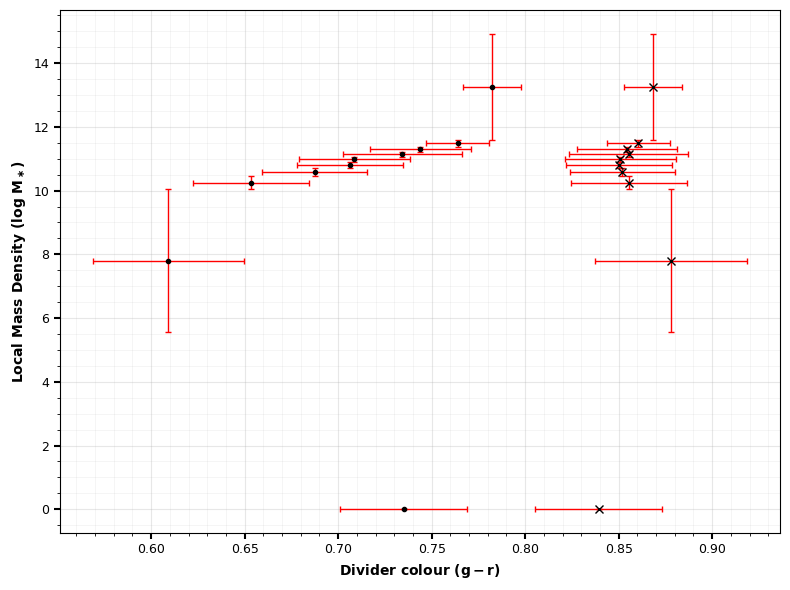

In [52]:
Mr_eval1 = -21.0
Mr_eval2 = -18.0

rho = LogMstar_N_2Mpc

# -----------------------------
# LogM* bins (equal width)
# -----------------------------
mask0 = rho != 0

rho_min = rho[mask0].min()
rho_max = rho[mask0].max()

nEnv = 10  # 1 zero bin + 9 bins
rho_edges = np.percentile(rho[mask0], np.linspace(0, 100, nEnv))

envCenters = np.zeros(nEnv)
env_err = np.zeros(nEnv)

# bin 0 (no neighbours)
envCenters[0] = 0.0
env_err[0] = 0.0

# logM bins
for i in range(1, nEnv):
    lo = rho_edges[i-1]
    hi = rho_edges[i]

    envCenters[i] = 0.5 * (lo + hi)
    env_err[i] = 0.5 * (hi - lo)

# -----------------------------
# Arrays
# -----------------------------
gr_M21 = np.full(nEnv, np.nan)
gr_err_M21 = np.full(nEnv, np.nan)

gr_M18 = np.full(nEnv, np.nan)
gr_err_M18 = np.full(nEnv, np.nan)

# -----------------------------
# Compute dividers
# -----------------------------
for j in range(nEnv):

    if j == 0:
        maskEnv = (rho == 0)
    else:
        lo = rho_edges[j-1]
        hi = rho_edges[j]

        if j == 1:
            maskEnv = (rho > 0) & (rho <= hi)
        else:
            maskEnv = (rho > lo) & (rho <= hi)

    Fig_Mr = M_r[maskEnv]
    Fig_gr = gr[maskEnv]

    dividers = []
    mrVals = []
    weights = []

    for i in range(len(MrEdges) - 1):

        Mr_hi = MrEdges[i]
        Mr_lo = MrEdges[i+1]

        Mr_mask = (Fig_Mr <= Mr_hi) & (Fig_Mr > Mr_lo)
        Fig_data = Fig_gr[Mr_mask]

        if len(Fig_data) < 20:
            continue

        try:
            bin_centers, counts, dg_fit, gauss1, gauss2, popt = \
                fn.fit_double_gauss(Fig_data, bins=grEdges)

            if np.sum(gauss1) > 0 and np.sum(gauss2) > 0:

                x_div, tau = fn.CR_div(bin_centers, gauss1, gauss2)

                if x_div is not None and np.isfinite(x_div):
                    dividers.append(x_div)
                    mrVals.append(0.5 * (Mr_hi + Mr_lo))
                    weights.append(len(Fig_data))

        except Exception:
            continue

    if len(dividers) >= 2:

        (a, b), cov = np.polyfit(
            mrVals, dividers,
            deg=1,
            w=weights,
            cov=True
        )

        # divider values
        gr_M21[j] = a * Mr_eval1 + b
        gr_M18[j] = a * Mr_eval2 + b

        # weighted RMS scatter
        mrVals_arr = np.array(mrVals)
        dividers_arr = np.array(dividers)
        weights_arr = np.array(weights)

        fit_vals = a * mrVals_arr + b
        resid = dividers_arr - fit_vals

        sigma_fit = np.sqrt(
            np.sum(weights_arr * resid**2) / np.sum(weights_arr)
        )

        gr_err_M21[j] = sigma_fit
        gr_err_M18[j] = sigma_fit

# -----------------------------
# Plot (flipped axes)
# -----------------------------
plt.rcParams.update({
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'xtick.major.width': 1.5,
    'ytick.major.width': 1.5,
    'xtick.major.size': 4,
    'ytick.major.size': 4,
})

fig, ax = plt.subplots(figsize=(8, 6))

valid = (
    np.isfinite(gr_M21) &
    np.isfinite(gr_err_M21) &
    np.isfinite(gr_M18) &
    np.isfinite(gr_err_M18)
)

# --- Mr = -21 ---
ax.errorbar(
    gr_M21[valid],
    envCenters[valid],
    xerr=gr_err_M21[valid],
    yerr=env_err[valid],
    fmt='x',
    color='black',
    ecolor='red',
    ms=6,
    capsize=2,
    linewidth=1
)

# --- Mr = -18 ---
ax.errorbar(
    gr_M18[valid],
    envCenters[valid],
    xerr=gr_err_M18[valid],
    yerr=env_err[valid],
    fmt='.',
    color='black',
    ecolor='red',
    ms=6,
    capsize=2,
    linewidth=1
)

# labels
ax.set_xlabel(r'Divider colour ($\mathbf{g-r}$)', weight='bold')
ax.set_ylabel(r'Local Mass Density ($\mathbf{log}\ \mathbf{M_\ast}$)', weight='bold')

# grid
ax.grid(True, which='major', alpha=0.3, linewidth=0.8)
ax.grid(True, which='minor', alpha=0.15, linewidth=0.6)
ax.minorticks_on()

plt.tight_layout()

plt.savefig("/pscratch/sd/s/suhas31/ThesisFigures/dividerEvolution_logM.png", dpi=100)
plt.show()

 ___
# Divider Evolution with Redshift and Local Stellar Mass Density

In [21]:
compute_script = "/global/u2/s/suhas31/thesisDraft2/cmdZxRho_cache.py"

if not os.path.exists(cache_file):
    print("Cache file not found. Running compute script...")
    subprocess.run(["python", compute_script], check=True)

else:
    print("Cache file found. Loading cached data.")

# Load cache
cache = np.load(
    "/pscratch/sd/s/suhas31/numpyFiles/cmdZxRho_cache.npz",
    allow_pickle=True
)

hist_cache = cache["hist_cache"]
divider_x_cache = cache["divider_x_cache"]
divider_mr_cache = cache["divider_mr_cache"]

alpha_cache = cache["alpha_cache"]
counts_cache = cache["counts_cache"]

zEdges = cache["zEdges"]
grBins = cache["grBins"]
mrBins = cache["mrBins"]

# Dimensions
nZ, nEnv = hist_cache.shape[:2]

grMin, grMax = grBins.min(), grBins.max()
mrMin, mrMax = mrBins.min(), mrBins.max()

env_titles = [
    "No neighbours",
    "Low Density",
    "Mid Density",
    "High Density",
]

# Figure
fig_w = 34    # 8 * nEnv + 2 for extra y labels
fig_h = 10 * nZ    # 8 * nZ

fig, axs = plt.subplots(
    nZ,
    nEnv,
    figsize=(fig_w, fig_h),
    sharex=True,
    sharey=True
)

axs = np.atleast_2d(axs)

cmap = plt.cm.viridis.copy()
darkest = plt.cm.viridis(0.0)
    
# Panels
for iz in range(nZ):

    zlo, zhi = zEdges[iz], zEdges[iz+1]

    for j in range(nEnv):

        ax = axs[iz, j]

        ax.tick_params(
            axis="both",
            which="major",
            labelsize=30,   # tick label font size
            width=3,        # tick thickness
            length=10       # tick length
        )
        
        ax.set_facecolor(darkest)

        h2d = hist_cache[iz, j].T

        hMax = h2d.max()
        hNorm = (h2d / hMax) if hMax > 0 else h2d

        ax.imshow(
            hNorm,
            origin="lower",
            extent=[grMin, grMax, mrMin, mrMax],
            cmap=cmap,
            aspect="auto",
            interpolation="nearest"
        )

        # divider points
        dividers = divider_x_cache[iz][j]
        Mr_vals = divider_mr_cache[iz][j]

        if dividers is not None:

            ax.scatter(
                dividers,
                Mr_vals,
                marker="+",
                c="white",
                s=250,
                alpha=.75,
            )

            if len(dividers) >= 2:

                coefs = np.polyfit(Mr_vals, dividers, deg=1)
                p = np.poly1d(coefs)

                xs = np.array([mrMin, mrMax])

                ax.plot(
                    p(xs),
                    xs,
                    "--",
                    c="white",
                    lw=2.5
                )

        # dividers = divider_x_cache[iz][j]
        # Mr_vals = divider_mr_cache[iz][j]
        
        # if dividers is not None and len(dividers) > 0:
        
        #     dividers = np.asarray(dividers)
        #     Mr_vals = np.asarray(Mr_vals)
        
        #     # remove bad values
        #     mask = np.isfinite(dividers) & np.isfinite(Mr_vals)
        
        #     dividers = dividers[mask]
        #     Mr_vals = Mr_vals[mask]
        
        #     # scatter always
        #     ax.scatter(
        #         dividers,
        #         Mr_vals,
        #         marker="+",
        #         c="white",
        #         s=250,
        #         alpha=.75,
        #     )
        
        #     # fit if possible
        #     if len(dividers) >= 2:
        
        #         coefs = np.polyfit(Mr_vals, dividers, deg=1)
        #         p = np.poly1d(coefs)
        
        #         xs = np.array([mrMin, mrMax])
        
        #         ax.plot(
        #             p(xs),
        #             xs,
        #             "--",
        #             c="white",
        #             lw=2.5
        #         )
        
        # annotations
        ax.text(
            0.02,0.98,
            f"N={int(counts_cache[iz,j])}",
            transform=ax.transAxes,
            ha="left",
            va="top",
            fontsize=32,
            color="white"
        )

        ax.text(
            0.98,0.02,
            rf"$\alpha={alpha_cache[iz,j]:.3f}$",
            transform=ax.transAxes,
            ha="right",
            va="bottom",
            fontsize=32,
            color="white"
        )

        if iz == 0:
            ax.set_title(env_titles[j], fontsize=32, weight="bold")

        if j == 0:
            ax.text(
                -.2,
                0.5,
                rf"$\mathbf{{{zlo:.3f}}}$ < $\mathbf{{z}}$ $\mathbf{{\leq}}$ $\mathbf{{{zhi:.3f}}}$",
                transform=ax.transAxes,
                rotation=90,
                ha="center",
                va="center",
                fontsize=32,
                weight="bold"
            )

        ax.set_xlim([-0.1,1.5])
        ax.set_ylim([-15,-24])

fig.supxlabel(r"$\mathbf{g-r}$", fontsize=34)
fig.supylabel(r"$\mathbf{M_r}$", fontsize=34)

plt.tight_layout(rect=[0.02, 0.02, 1., .99])

plt.savefig(
    "/pscratch/sd/s/suhas31/ThesisFigures/cmdZxRho.pdf"
)

plt.show()

Cache file found. Loading cached data.


In [54]:
compute_script = "/global/u2/s/suhas31/thesisDraft2/cmdZxRho_cache.py"

if not os.path.exists(cache_file):
    print("Cache file not found. Running compute script...")
    subprocess.run(["python", compute_script], check=True)

else:
    print("Cache file found. Loading cached data.")

# Load cache
cache = np.load(
    "/pscratch/sd/s/suhas31/numpyFiles/cmdZxRho_cache.npz",
    allow_pickle=True
)

hist_cache = cache["hist_cache"]
divider_x_cache = cache["divider_x_cache"]
divider_mr_cache = cache["divider_mr_cache"]

alpha_cache = cache["alpha_cache"]
counts_cache = cache["counts_cache"]

zEdges = cache["zEdges"]
grBins = cache["grBins"]
mrBins = cache["mrBins"]

# Dimensions
nZ, nEnv = hist_cache.shape[:2]

# -----------------------------
# Split settings
# -----------------------------
n_chunks = 5   # number of output figures
z_splits = np.array_split(np.arange(nZ), n_chunks)

grMin, grMax = grBins.min(), grBins.max()
mrMin, mrMax = mrBins.min(), mrBins.max()

env_titles = [
    "No neighbours",
    "Low Density",
    "Mid Density",
    "High Density",
]

# -----------------------------
# Loop over chunks
# -----------------------------
for k, z_idx_chunk in enumerate(z_splits):

    nz_chunk = len(z_idx_chunk)

    fig_w = 34
    fig_h = 10 * nz_chunk   # scale height properly

    fig, axs = plt.subplots(
        nz_chunk,
        nEnv,
        figsize=(fig_w, fig_h),
        sharex=True,
        sharey=True
    )

    axs = np.atleast_2d(axs)

    for ii, iz in enumerate(z_idx_chunk):

        zlo, zhi = zEdges[iz], zEdges[iz+1]

        for j in range(nEnv):

            ax = axs[ii, j]

            ax.tick_params(
                axis="both",
                which="major",
                labelsize=30,
                width=3,
                length=10
            )

            ax.set_facecolor(darkest)

            h2d = hist_cache[iz, j].T
            hMax = h2d.max()
            hNorm = (h2d / hMax) if hMax > 0 else h2d

            ax.imshow(
                hNorm,
                origin="lower",
                extent=[grMin, grMax, mrMin, mrMax],
                cmap=cmap,
                aspect="auto",
                interpolation="nearest"
            )

            # divider points
            dividers = divider_x_cache[iz][j]
            Mr_vals = divider_mr_cache[iz][j]

            if dividers is not None:

                ax.scatter(
                    dividers,
                    Mr_vals,
                    marker="+",
                    c="white",
                    s=250,
                    alpha=.75,
                )

                if len(dividers) >= 2:

                    coefs = np.polyfit(Mr_vals, dividers, deg=1)
                    p = np.poly1d(coefs)

                    xs = np.array([mrMin, mrMax])

                    ax.plot(
                        p(xs),
                        xs,
                        "--",
                        c="white",
                        lw=2.5
                    )

            # annotations
            ax.text(
                0.02, 0.98,
                f"N={int(counts_cache[iz,j])}",
                transform=ax.transAxes,
                ha="left",
                va="top",
                fontsize=32,
                color="white"
            )

            ax.text(
                0.98, 0.02,
                rf"$\alpha={alpha_cache[iz,j]:.3f}$",
                transform=ax.transAxes,
                ha="right",
                va="bottom",
                fontsize=32,
                color="white"
            )

            # titles (only first row of each chunk)
            if ii == 0:
                ax.set_title(env_titles[j], fontsize=32, weight="bold")

            # redshift labels (left column)
            if j == nEnv - 1:
                ax.text(
                    1.04,   # just to the right of the rightmost panel
                    0.5,
                    rf"$\mathbf{{{zlo:.3f}}}$ < $\mathbf{{z}}$ $\mathbf{{\leq}}$ $\mathbf{{{zhi:.3f}}}$",
                    transform=ax.transAxes,
                    rotation=-90,
                    ha="center",
                    va="center",
                    fontsize=32,
                    weight="bold"
                )

            ax.set_xlim([-0.1, 1.5])
            ax.set_ylim([-15, -24])
            # ax.set_yticks(np.arange(-24, -14, 2))
            # ax.set_yticks(np.arange(-23, -14, 2), minor=True)
            # ax.tick_params(
            #     axis="y",
            #     which="minor",
            #     length=8,
            #     width=4

    fig.supxlabel(r"$\mathbf{g-r}$", fontsize=34)
    fig.supylabel(r"$\mathbf{M_r}$", fontsize=34)

    plt.tight_layout(rect=[0.015, 0.005, .98, 1.])
    fig.subplots_adjust(hspace=0.075)

    # -----------------------------
    # Save with suffix
    # -----------------------------
    out_path = f"/pscratch/sd/s/suhas31/ThesisFigures/cmdZxRho_p{k+1}.pdf"

    plt.savefig(out_path)
    plt.close(fig)

    print(f"Saved: {out_path}")

Cache file found. Loading cached data.
Saved: /pscratch/sd/s/suhas31/ThesisFigures/cmdZxRho_p1.pdf
Saved: /pscratch/sd/s/suhas31/ThesisFigures/cmdZxRho_p2.pdf
Saved: /pscratch/sd/s/suhas31/ThesisFigures/cmdZxRho_p3.pdf
Saved: /pscratch/sd/s/suhas31/ThesisFigures/cmdZxRho_p4.pdf
Saved: /pscratch/sd/s/suhas31/ThesisFigures/cmdZxRho_p5.pdf


In [64]:
# # -----------------------------
# # Setup
# # -----------------------------
# Mr_eval1 = -21.0
# Mr_eval2 = -18.0

# zCenters = 0.5 * (zEdges[:-1] + zEdges[1:])
# z_err = np.full_like(zCenters, (zEdges[1] - zEdges[0]) / 2)

# env_indices = [0, 1, 2, 3]  # 4 panels

# # containers
# gr_M21 = np.full((4, len(zCenters)), np.nan)
# gr_err_M21 = np.full_like(gr_M21, np.nan)

# gr_M18 = np.full_like(gr_M21, np.nan)
# gr_err_M18 = np.full_like(gr_M21, np.nan)

# # -----------------------------
# # Compute from CACHE (fast)
# # -----------------------------
# for k, j in enumerate(env_indices):

#     for iz in range(len(zCenters)):

#         dividers = divider_x_cache[iz][j]
#         mrVals = divider_mr_cache[iz][j]

#         if dividers is None or len(dividers) < 2:
#             continue

#         # linear fit
#         a, b = np.polyfit(mrVals, dividers, deg=1)

#         # evaluate
#         gr_M21[k, iz] = a * Mr_eval1 + b
#         gr_M18[k, iz] = a * Mr_eval2 + b

#         # weighted RMS scatter
#         fit_vals = a * np.array(mrVals) + b
#         resid = np.array(dividers) - fit_vals

#         sigma = np.sqrt(np.mean(resid**2))

#         gr_err_M21[k, iz] = sigma
#         gr_err_M18[k, iz] = sigma

# # -----------------------------
# # Plot
# # -----------------------------
# plt.rcParams.update({
#     'xtick.labelsize': 9,
#     'ytick.labelsize': 9,
#     'xtick.major.width': 1.5,
#     'ytick.major.width': 1.5,
#     'xtick.major.size': 4,
#     'ytick.major.size': 4,
# })

# fig, axs = plt.subplots(1, 4, figsize=(16, 4), sharey=True)

# # reference = no neighbours
# ref_M21 = gr_M21[0]
# ref_M18 = gr_M18[0]
# ref_err = gr_err_M21[0]

# for k, ax in enumerate(axs):

#     valid = (
#         np.isfinite(gr_M21[k]) &
#         np.isfinite(gr_err_M21[k]) &
#         np.isfinite(gr_M18[k]) &
#         np.isfinite(gr_err_M18[k])
#     )

#     m_low = (zCenters <= 0.3) & valid
#     m_high = (zCenters > 0.3) & valid

#     # -----------------------------
#     # Reference shading (panels 2–4)
#     # -----------------------------
#     if k != 0:

#         # --- Dark band (between -21 and -18) ---
#         lower_dark = np.minimum(ref_M21, ref_M18)
#         upper_dark = np.maximum(ref_M21, ref_M18)

#         ax.fill_betweenx(
#             zCenters,
#             lower_dark,
#             upper_dark,
#             color='black',
#             alpha=0.25,
#             zorder=0
#         )

#         # --- Light band (including errors) ---
#         lower_light = np.minimum(
#             ref_M21 - ref_err,
#             ref_M18 - ref_err
#         )

#         upper_light = np.maximum(
#             ref_M21 + ref_err,
#             ref_M18 + ref_err
#         )

#         ax.fill_betweenx(
#             zCenters,
#             lower_light,
#             upper_light,
#             color='gray',
#             alpha=0.15,
#             zorder=0
#         )

#     # -----------------------------
#     # Points (same style as original)
#     # -----------------------------

#     # M_r = -21
#     ax.errorbar(
#         gr_M21[k][m_low],
#         zCenters[m_low],
#         xerr=gr_err_M21[k][m_low],
#         yerr=z_err[m_low],
#         fmt='x',
#         color='black',
#         ecolor='red',
#         ms=6,
#         capsize=2
#     )

#     ax.errorbar(
#         gr_M21[k][m_high],
#         zCenters[m_high],
#         xerr=gr_err_M21[k][m_high],
#         yerr=z_err[m_high],
#         fmt='x',
#         color='black',
#         ecolor='gray',
#         ms=4,
#         capsize=2
#     )

#     # M_r = -18
#     ax.errorbar(
#         gr_M18[k][m_low],
#         zCenters[m_low],
#         xerr=gr_err_M18[k][m_low],
#         yerr=z_err[m_low],
#         fmt='.',
#         color='black',
#         ecolor='red',
#         ms=6,
#         capsize=2
#     )

#     ax.errorbar(
#         gr_M18[k][m_high],
#         zCenters[m_high],
#         xerr=gr_err_M18[k][m_high],
#         yerr=z_err[m_high],
#         fmt='.',
#         color='black',
#         ecolor='gray',
#         ms=4,
#         capsize=2
#     )

#     # formatting
#     ax.set_title(env_titles[k], fontsize=12, weight='bold')
#     ax.set_xlim(-.5, 1.1)
#     ax.set_ylim(zCenters.min() - 0.02, zCenters.max() + 0.02)
#     ax.invert_yaxis()

#     ax.grid(True, which='major', alpha=0.25)
#     ax.grid(True, which='minor', alpha=0.1)
#     ax.minorticks_on()

# # labels
# axs[0].set_ylabel(r'Redshift ($\mathbf{z}$)', fontsize=10, weight='bold')

# for ax in axs:
#     ax.set_xlabel(r'Divider colour ($\mathbf{g-r}$)', fontsize=10, weight='bold')

# plt.tight_layout()
# plt.savefig("/pscratch/sd/s/suhas31/ThesisFigures/dividerEvolution_env_panels.png", dpi=150)
# plt.show()

In [68]:
# # -----------------------------
# # Setup
# # -----------------------------
# Mr_eval1 = -21.0
# Mr_eval2 = -18.0

# zCenters = 0.5 * (zEdges[:-1] + zEdges[1:])
# z_err = np.full_like(zCenters, (zEdges[1] - zEdges[0]) / 2)

# env_indices = [0, 1, 2, 3]  # 4 panels

# # containers
# gr_M21 = np.full((4, len(zCenters)), np.nan)
# gr_err_M21 = np.full_like(gr_M21, np.nan)

# gr_M18 = np.full_like(gr_M21, np.nan)
# gr_err_M18 = np.full_like(gr_M21, np.nan)

# # -----------------------------
# # Compute from CACHE (fast)
# # -----------------------------
# for k, j in enumerate(env_indices):

#     for iz in range(len(zCenters)):

#         dividers = divider_x_cache[iz][j]
#         mrVals = divider_mr_cache[iz][j]

#         if dividers is None or len(dividers) < 2:
#             continue

#         # linear fit
#         a, b = np.polyfit(mrVals, dividers, deg=1)

#         # evaluate
#         gr_M21[k, iz] = a * Mr_eval1 + b
#         gr_M18[k, iz] = a * Mr_eval2 + b

#         # weighted RMS scatter
#         fit_vals = a * np.array(mrVals) + b
#         resid = np.array(dividers) - fit_vals

#         sigma = np.sqrt(np.mean(resid**2))

#         gr_err_M21[k, iz] = sigma
#         gr_err_M18[k, iz] = sigma

# # -----------------------------
# # Plot
# # -----------------------------
# plt.rcParams.update({
#     'xtick.labelsize': 9,
#     'ytick.labelsize': 9,
#     'xtick.major.width': 1.5,
#     'ytick.major.width': 1.5,
#     'xtick.major.size': 4,
#     'ytick.major.size': 4,
# })

# fig, axs = plt.subplots(1, 4, figsize=(16, 4), sharey=True)

# # reference = no neighbours
# ref_M21 = gr_M21[0]
# ref_M18 = gr_M18[0]
# ref_err = gr_err_M21[0]

# for k, ax in enumerate(axs):

#     valid = (
#         np.isfinite(gr_M21[k]) &
#         np.isfinite(gr_err_M21[k]) &
#         np.isfinite(gr_M18[k]) &
#         np.isfinite(gr_err_M18[k])
#     )

#     m_low = (zCenters <= 0.3) & valid
#     m_high = (zCenters > 0.3) & valid

#     # -----------------------------
#     # Reference shading (panels 2–4)
#     # -----------------------------
#     if k != 0:

#         # --- Dark band (between -21 and -18) ---
#         lower_dark = np.minimum(ref_M21, ref_M18)
#         upper_dark = np.maximum(ref_M21, ref_M18)

#         ax.fill_betweenx(
#             zCenters,
#             lower_dark,
#             upper_dark,
#             color='black',
#             alpha=0.25,
#             zorder=0
#         )

#         # --- Light band (including errors) ---
#         lower_light = np.minimum(
#             ref_M21 - ref_err,
#             ref_M18 - ref_err
#         )

#         upper_light = np.maximum(
#             ref_M21 + ref_err,
#             ref_M18 + ref_err
#         )

#         ax.fill_betweenx(
#             zCenters,
#             lower_light,
#             upper_light,
#             color='gray',
#             alpha=0.15,
#             zorder=0
#         )

#     # -----------------------------
#     # Points (same style as original)
#     # -----------------------------

#     # M_r = -21
#     ax.errorbar(
#         gr_M21[k][m_low],
#         zCenters[m_low],
#         xerr=gr_err_M21[k][m_low],
#         yerr=z_err[m_low],
#         fmt='x',
#         color='black',
#         ecolor='red',
#         ms=6,
#         capsize=2
#     )

#     ax.errorbar(
#         gr_M21[k][m_high],
#         zCenters[m_high],
#         xerr=gr_err_M21[k][m_high],
#         yerr=z_err[m_high],
#         fmt='x',
#         color='black',
#         ecolor='gray',
#         ms=4,
#         capsize=2
#     )

#     # M_r = -18
#     ax.errorbar(
#         gr_M18[k][m_low],
#         zCenters[m_low],
#         xerr=gr_err_M18[k][m_low],
#         yerr=z_err[m_low],
#         fmt='.',
#         color='black',
#         ecolor='red',
#         ms=6,
#         capsize=2
#     )

#     ax.errorbar(
#         gr_M18[k][m_high],
#         zCenters[m_high],
#         xerr=gr_err_M18[k][m_high],
#         yerr=z_err[m_high],
#         fmt='.',
#         color='black',
#         ecolor='gray',
#         ms=4,
#         capsize=2
#     )

#     # formatting
#     ax.set_title(env_titles[k], fontsize=12, weight='bold')
#     ax.set_xlim(-.5, 1.1)
#     ax.set_ylim(zCenters.min() - 0.02, zCenters.max() + 0.02)
#     ax.invert_yaxis()

#     ax.grid(True, which='major', alpha=0.25)
#     ax.grid(True, which='minor', alpha=0.1)
#     ax.minorticks_on()

# # labels
# axs[0].set_ylabel(r'Redshift ($\mathbf{z}$)', fontsize=10, weight='bold')

# for ax in axs:
#     ax.set_xlabel(r'Divider colour ($\mathbf{g-r}$)', fontsize=10, weight='bold')

# plt.tight_layout()
# plt.savefig("/pscratch/sd/s/suhas31/ThesisFigures/dividerEvolution_env_panels.png", dpi=150)
# plt.show()

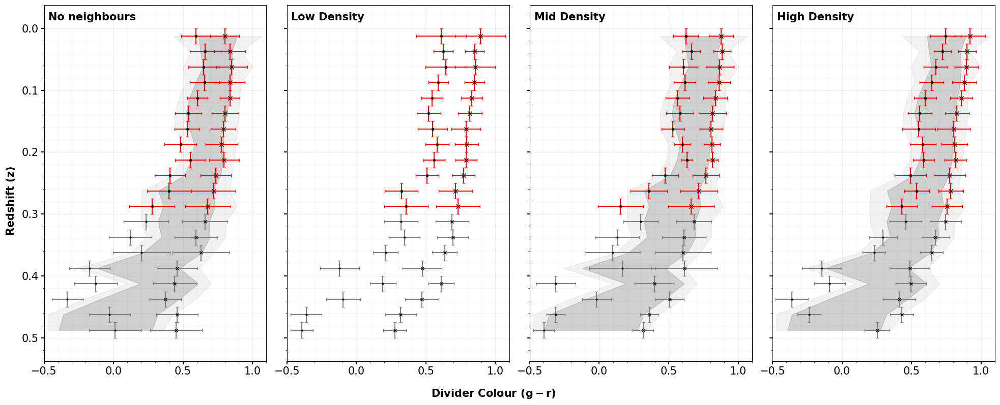

In [133]:
# -----------------------------
# Setup
# -----------------------------
Mr_eval1 = -21.0
Mr_eval2 = -18.0

zCenters = 0.5 * (zEdges[:-1] + zEdges[1:])
z_err = np.full_like(zCenters, (zEdges[1] - zEdges[0]) / 2)

env_indices = [0, 1, 2, 3]  # 4 panels

# containers
gr_M21 = np.full((4, len(zCenters)), np.nan)
gr_err_M21 = np.full_like(gr_M21, np.nan)

gr_M18 = np.full_like(gr_M21, np.nan)
gr_err_M18 = np.full_like(gr_M21, np.nan)

# -----------------------------
# Compute from CACHE (fast)
# -----------------------------
for k, j in enumerate(env_indices):

    for iz in range(len(zCenters)):

        dividers = divider_x_cache[iz][j]
        mrVals = divider_mr_cache[iz][j]

        if dividers is None or len(dividers) < 2:
            continue

        # linear fit
        a, b = np.polyfit(mrVals, dividers, deg=1)

        # evaluate
        gr_M21[k, iz] = a * Mr_eval1 + b
        gr_M18[k, iz] = a * Mr_eval2 + b

        # weighted RMS scatter
        fit_vals = a * np.array(mrVals) + b
        resid = np.array(dividers) - fit_vals

        sigma = np.sqrt(np.mean(resid**2))

        gr_err_M21[k, iz] = sigma
        gr_err_M18[k, iz] = sigma

# -----------------------------
# Plot
# -----------------------------
plt.rcParams.update({
    'xtick.labelsize': 15,
    'ytick.labelsize': 15,
    'xtick.major.width': 1.5,
    'ytick.major.width': 1.5,
    'xtick.major.size': 4,
    'ytick.major.size': 4,
})

fig, axs = plt.subplots(
    1, 4,
    figsize=(20, 8),
    sharex=True,
    sharey=True
)

# reference = no neighbours
ref_M21 = gr_M21[1]
ref_M18 = gr_M18[1]
ref_err = gr_err_M21[1]

for k, ax in enumerate(axs):

    valid = (
        np.isfinite(gr_M21[k]) &
        np.isfinite(gr_err_M21[k]) &
        np.isfinite(gr_M18[k]) &
        np.isfinite(gr_err_M18[k])
    )

    m_low = (zCenters <= 0.3) & valid
    m_high = (zCenters > 0.3) & valid

    # -----------------------------
    # Reference shading (panels 2–4)
    # -----------------------------
    if k != 1:

        lower_dark = np.minimum(ref_M21, ref_M18)
        upper_dark = np.maximum(ref_M21, ref_M18)

        ax.fill_betweenx(
            zCenters,
            lower_dark,
            upper_dark,
            color='black',
            alpha=0.15,
            zorder=0
        )

        lower_light = np.minimum(
            ref_M21 - ref_err,
            ref_M18 - ref_err
        )

        upper_light = np.maximum(
            ref_M21 + ref_err,
            ref_M18 + ref_err
        )

        ax.fill_betweenx(
            zCenters,
            lower_light,
            upper_light,
            color='gray',
            alpha=0.1,
            zorder=0
        )

    # -----------------------------
    # Points
    # -----------------------------
    ax.errorbar(
        gr_M21[k][m_low],
        zCenters[m_low],
        xerr=gr_err_M21[k][m_low],
        yerr=z_err[m_low],
        fmt='x',
        color='black',
        ecolor='red',
        ms=6,
        capsize=2
    )

    ax.errorbar(
        gr_M21[k][m_high],
        zCenters[m_high],
        xerr=gr_err_M21[k][m_high],
        yerr=z_err[m_high],
        fmt='x',
        color='black',
        ecolor='gray',
        ms=4,
        capsize=2
    )

    ax.errorbar(
        gr_M18[k][m_low],
        zCenters[m_low],
        xerr=gr_err_M18[k][m_low],
        yerr=z_err[m_low],
        fmt='.',
        color='black',
        ecolor='red',
        ms=6,
        capsize=2
    )

    ax.errorbar(
        gr_M18[k][m_high],
        zCenters[m_high],
        xerr=gr_err_M18[k][m_high],
        yerr=z_err[m_high],
        fmt='.',
        color='black',
        ecolor='gray',
        ms=4,
        capsize=2
    )

    # -----------------------------
    # In-panel title (top-left)
    # -----------------------------
    ax.text(
        0.02, 0.98,
        env_titles[k],
        transform=ax.transAxes,
        ha='left',
        va='top',
        fontsize=15,
        weight='bold'
    )

    # formatting
    ax.set_xlim(-0.5, 1.1)
    ax.set_ylim(zCenters.min() - 0.05, zCenters.max() + 0.05)
    ax.invert_yaxis()

    ax.grid(True, which='major', alpha=0.25)
    ax.grid(True, which='minor', alpha=0.1)
    ax.minorticks_on()

# labels
fig.supylabel(r'Redshift ($\mathbf{z}$)', fontsize=15, weight='bold')
fig.supxlabel(r'Divider Colour ($\mathbf{g-r}$)', fontsize=15, weight='bold')

# -----------------------------
# Remove ALL vertical spacing
# -----------------------------

plt.tight_layout(rect=[.01, .0, 1., 1.])
plt.subplots_adjust(hspace=0)

plt.savefig(
    "/pscratch/sd/s/suhas31/ThesisFigures/dividerEvolution_ZxRho.pdf",
    )

plt.show()

# -----------------------------
# Build table
# -----------------------------

rows = []

for iz in range(len(zCenters)):

    row = {}

    # Redshift bin label
    z_lo = zEdges[iz]
    z_hi = zEdges[iz+1]

    row["z_bin"] = f"{z_lo:.3f}–{z_hi:.3f}"

    # Fill values for each environment
    labels = ["no neighbours", "low density", "mid density", "high density"]

    for k, label in enumerate(labels):

        row[f"{label} (M_r=-21)"] = gr_M21[k, iz]
        row[f"{label} (M_r=-18)"] = gr_M18[k, iz]

    rows.append(row)

df = pd.DataFrame(rows)

# -----------------------------
# Save as CSV (for sanity check)
# -----------------------------

table_path = '/pscratch/sd/s/suhas31/ThesisTables/'
df.to_csv(table_path+'dividerEvolution_ZxRho.csv', index=False)

latex_table = df.to_latex(
    index=False,
    float_format="%.3f",
    na_rep="",
    escape=False
)

# manually fix headers
latex_table = latex_table.replace(
    "no neighbours (M_r=-21)",
    "\\multicolumn{2}{c}{No Neighbours}"
).replace(
    "low density (M_r=-21)",
    "\\multicolumn{2}{c}{Low Density}"
).replace(
    "mid density (M_r=-21)",
    "\\multicolumn{2}{c}{Mid Density}"
).replace(
    "high density (M_r=-21)",
    "\\multicolumn{2}{c}{High Density}"
)

with open(table_path+"dividerEvolution_ZxRho.tex", "w") as f:
    f.write(latex_table)

In [132]:
print('No Neighbours:')
print(f'Mr18 = {gr_M18[0]}')
print(f'Mr21 = {gr_M21[0]}')
print()

print('Low Density:')
print(f'Mr18 = {gr_M18[1]}')
print(f'Mr21 = {gr_M21[1]}')
print()

print('Mid Density:')
print(f'Mr18 = {gr_M18[2]}')
print(f'Mr21 = {gr_M21[2]}')
print()

print('High Density:')
print(f'Mr18 = {gr_M18[3]}')
print(f'Mr21 = {gr_M21[3]}')
print()

No Neighbours:
Mr18 = [ 0.59267918  0.66049645  0.64818353  0.65544624  0.60397595  0.53736513
  0.5300021   0.48224977  0.55294547  0.40719854  0.40072627  0.27771219
  0.23511817  0.12053068  0.20237747 -0.17372906 -0.12874364 -0.33183343
 -0.02842666  0.01167213]
Mr21 = [0.80062999 0.83663659 0.85119426 0.83961538 0.83737129 0.80325207
 0.78941387 0.77681252 0.79570959 0.73760139 0.71972652 0.67764418
 0.65736592 0.5929832  0.62847071 0.4569932  0.43937606 0.37436725
 0.45713021 0.44934355]

Low Density:
Mr18 = [ 0.61154116  0.62528932  0.64249934  0.59027217  0.54590163  0.52081363
  0.54802034  0.58084457  0.55972332  0.50992857  0.32397368  0.35776316
  0.3213274   0.34514099  0.21000735 -0.12041964  0.1907736  -0.09455399
 -0.36130245 -0.39281818]
Mr21 = [0.89183079 0.85128839 0.85690176 0.84994512 0.82970593 0.81729097
 0.78893277 0.79420326 0.79050395 0.77028571 0.71357895 0.73078947
 0.68912926 0.69324508 0.63486029 0.47502679 0.60969843 0.47080843
 0.31841783 0.27604545]

Mi

In [130]:
percentiles = [0, 33, 66, 100]
rho = LogMstar_N_2Mpc

table_vals = np.full((len(zCenters), len(percentiles)), np.nan)

# -----------------------------
# Compute percentiles per z bin
# -----------------------------
for iz in range(len(zCenters)):

    z_lo = zEdges[iz]
    z_hi = zEdges[iz+1]

    mask = (Z > z_lo) & (Z <= z_hi) & (rho > 0)

    if np.count_nonzero(mask) < 50:
        continue

    table_vals[iz] = np.percentile(rho[mask], percentiles)

# -----------------------------
# Print LaTeX table (your style)
# -----------------------------
print("\\begin{tabular}{ccccc}")
print("\\toprule")
print(" & \\multicolumn{4}{c}{Logarithmic Stellar Mass} \\\\")
print("\\cmidrule(lr){2-5}")
print("$z$ bin & 0\\% & 33\\% & 66\\% & 100\\% \\\\")
print("\\midrule")

for iz in range(len(zCenters)):

    if not np.all(np.isfinite(table_vals[iz])):
        continue

    z_lo = zEdges[iz]
    z_hi = zEdges[iz+1]

    vals = table_vals[iz]

    print(f"{z_lo:.3f}--{z_hi:.3f} & "
          f"{vals[0]:.3f} & {vals[1]:.3f} & {vals[2]:.3f} & {vals[3]:.3f} \\\\")

print("\\bottomrule")
print("\\end{tabular}")

\begin{tabular}{ccccc}
\toprule
 & \multicolumn{4}{c}{Logarithmic Stellar Mass} \\
\cmidrule(lr){2-5}
$z$ bin & 0\% & 33\% & 66\% & 100\% \\
\midrule
0.000--0.025 & 5.548 & 9.370 & 10.701 & 12.271 \\
0.025--0.050 & 6.201 & 9.995 & 11.034 & 12.398 \\
0.050--0.075 & 6.856 & 10.199 & 11.076 & 12.337 \\
0.075--0.100 & 7.033 & 10.404 & 11.144 & 12.518 \\
0.100--0.125 & 7.435 & 10.483 & 11.138 & 12.452 \\
0.125--0.150 & 7.918 & 10.572 & 11.155 & 12.550 \\
0.150--0.175 & 8.197 & 10.636 & 11.170 & 12.564 \\
0.175--0.200 & 8.236 & 10.701 & 11.187 & 12.426 \\
0.200--0.225 & 8.498 & 10.766 & 11.214 & 12.617 \\
0.225--0.250 & 8.515 & 10.822 & 11.235 & 12.504 \\
0.250--0.275 & 8.312 & 10.875 & 11.261 & 12.646 \\
0.275--0.300 & 8.605 & 10.919 & 11.279 & 12.403 \\
0.300--0.325 & 8.933 & 10.986 & 11.315 & 12.432 \\
0.325--0.350 & 8.192 & 11.037 & 11.342 & 12.559 \\
0.350--0.375 & 9.152 & 11.087 & 11.376 & 12.566 \\
0.375--0.400 & 9.260 & 11.129 & 11.412 & 12.507 \\
0.400--0.425 & 9.252 & 11.173 & 11.4